In [1]:
%matplotlib inline

In [2]:
from pylab import *

In [3]:
import pickle

In [4]:
def load(name):
    return pickle.load(open(name,'rb'), encoding='latin1')

In [5]:
fls = !ls
fls = list(filter(lambda fl: fl.endswith('.p'), fls))

In [6]:
len(fls)

120

In [12]:
res = {}
for fl in fls:
    (p,(w_end, w_endi, assigned_spikes, hertz_factor, patterns, spike_counts, N_presentations, N_input,p1_ind, p2_ind, ws, wsi)) = load(fl)
    arg = (p["neuron"]["tau_adap"], p["learn"]["eta_i_factor"],p["i"])
    res[arg] = (p,(w_end, w_endi, assigned_spikes, hertz_factor, patterns, spike_counts, N_presentations, N_input,p1_ind, p2_ind, ws, wsi))


In [19]:
param_combs = list(set((a[0], a[1]) for a in res.keys()))

In [20]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [21]:
group_size=5

In [22]:
param_combs

[(500.0, 20.0),
 (1000.0, 10.0),
 (1000.0, 20.0),
 (500.0, 10.0),
 (500.0, 5.0),
 (1000.0, 5.0)]

/home/dominik/anaconda3/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


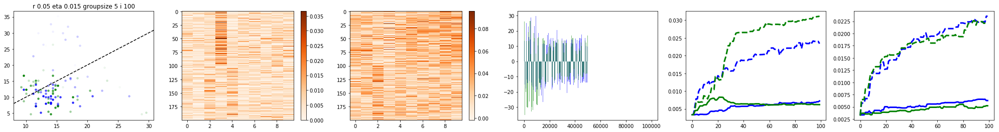

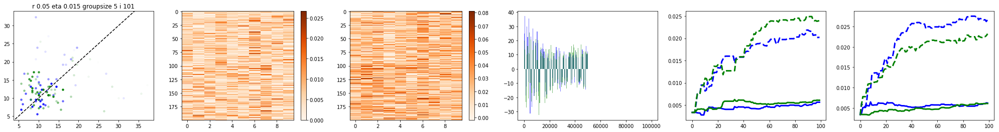

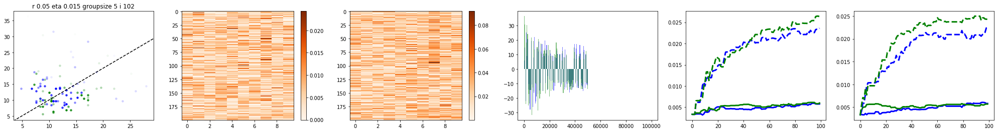

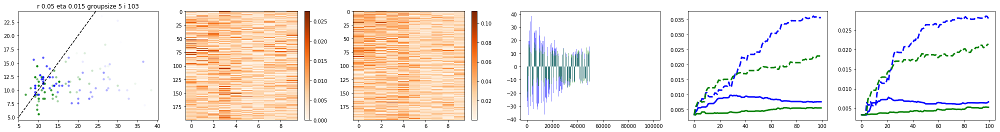

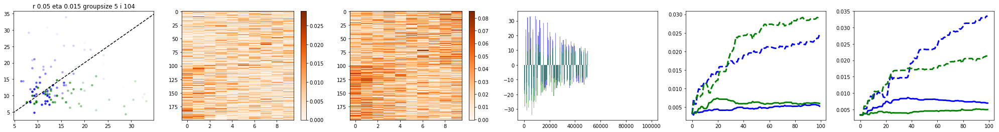

...

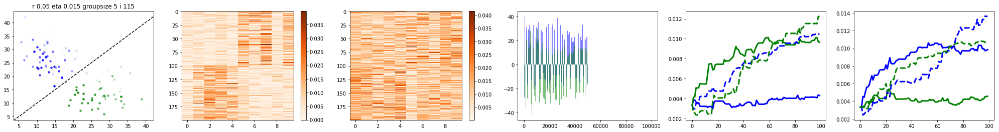

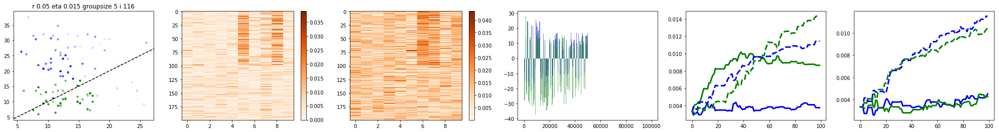

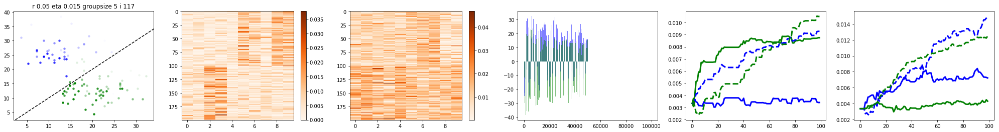

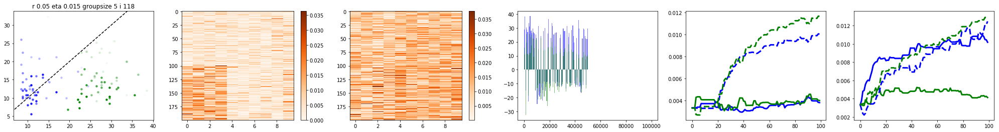

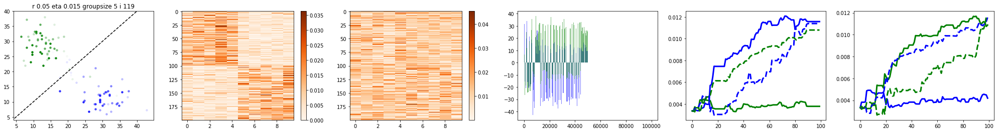

In [26]:
for param in param_combs:
    for i in range(100,120):
        k = (param[0], param[1], i)
        (p,(w_end, w_endi, assigned_spikes, hertz_factor, patterns, spike_counts, N_presentations, N_input,p1_ind, p2_ind, ws, wsi)) = res[k]
        figure(figsize=(35,4))
        subplot(1,6,1)
        
        colors = ["b", "g"]
        for idx, pat in enumerate(patterns):
            scatter(spike_counts[idx,0], spike_counts[idx,1], c=colors[pat], lw=0, s=20, alpha=1.0/N_presentations*(idx+1))
        xl, yl = xlim(), ylim()
        plot([0,1000], [0,1000], "k--")
        xlim(xl)
        ylim(yl)
        title('tau_adap {0} eta {1} i {2}'.format(p["neuron"]["tau_adap"], p["learn"]["eta_i_factor"], i))
        
        subplot(1,6,2)
        imshow(w_end.T,aspect="auto",interpolation="nearest",cmap="Oranges")
        colorbar()
        
        subplot(1,6,3)
        imshow(w_endi.T,aspect="auto",interpolation="nearest",cmap="Oranges")
        colorbar()
        
        subplot(1,6,4)
        for pattern in [0,1]:
            for group_idx in [0,1]:
                hist, bins = np.histogram(assigned_spikes[(group_idx,pattern)],bins=arange(0,100000+1,500))
                factor = hertz_factor*(pattern*2-1)
                try:
                    width = 0.9*(bins[1]-bins[0])
                except:
                    width = 1.0
                center = (bins[:-1] + bins[1:]) / 2
                plt.bar(center, factor*hist, align="center", width=width, color=colors[group_idx], alpha=0.5)
         
        subplot(1,6,5)
        plot(np.mean(ws[:group_size,p1_ind,:],(0,1)), "b", lw=3)
        plot(np.mean(ws[group_size:,p1_ind,:],(0,1)), "g", lw=3)
        plot(np.mean(wsi[:group_size,p1_ind,:],(0,1)), "b--", lw=3)
        plot(np.mean(wsi[group_size:,p1_ind,:],(0,1)), "g--", lw=3)
        
        subplot(1,6,6)
        plot(np.mean(ws[:group_size,p2_ind,:],(0,1)), "b", lw=3)
        plot(np.mean(ws[group_size:,p2_ind,:],(0,1)), "g", lw=3)
        plot(np.mean(wsi[:group_size,p2_ind,:],(0,1)), "b--", lw=3)
        plot(np.mean(wsi[group_size:,p2_ind,:],(0,1)), "g--", lw=3)
        